In [1]:
import pipit as pp
import pandas as pd
import pipit.plotting.core as vis
from pipit.partitions import Event, Partition, get_partition_graph

### Load Dataset

In [2]:
#Path to OTF2 traces
dirname = "../../pipit/tests/data/game-of-life-otf2"

# Use pipit's ``from_otf2`` API to read in the OTF2 traces.
# The result is stored into pipit's Trace data structure.
trace = pp.Trace.from_otf2(dirname)

# Printout the DataFrame component of the Trace.
display (trace.events.columns)
display (trace.events[trace.events['Process'] == 0].head(40))
display (trace.events.loc[17]['Attributes'])

Index(['Timestamp (ns)', 'Event Type', 'Name', 'Thread', 'Process',
       'Attributes'],
      dtype='object')

,Timestamp (ns),Event Type,Name,Thread,Process,Attributes
2,1.539486e+05,Instant,ProgramBegin,0,0,"{'attributes': {'Attribute 2': 1463386}, 'prog..."
3,1.764308e+05,Enter,"int main(int, char**)",0,0,{'region': 'Region 3'}
5,1.022166e+06,Enter,"void read_input_file(int**, const string&)",0,0,{'region': 'Region 5'}
13,8.269680e+08,Leave,"void read_input_file(int**, const string&)",0,0,None
15,8.270060e+08,Enter,MPI_Init,0,0,{'region': 'Region 151'}
23,1.478312e+09,Leave,MPI_Init,0,0,None
27,1.478332e+09,Enter,MPI_Comm_size,0,0,{'region': 'Region 40'}
33,1.478341e+09,Leave,MPI_Comm_size,0,0,None
35,1.478343e+09,Enter,MPI_Comm_rank,0,0,{'region': 'Region 37'}
38,1.478353e+09,Leave,MPI_Comm_rank,0,0,None


{'region': 'Region 151'}

In [3]:
# Plot Timeline
import os 
os.environ["BOKEH_ALLOW_WS_ORIGIN"] = 'localhost:8890'

trace.plot_timeline()

### Matching MPI Events

In [4]:
trace._match_mpi()

In [5]:
# Get a filtered event dataframe with only MPI events.
mpi_trace = trace.events[trace.events['Name'].str.contains('MpiSend|MpiRecv')]
display (mpi_trace.head(100))

,Timestamp (ns),Event Type,Name,Thread,Process,Attributes,_matching_event,_matching_timestamp,_depth,_parent,_children,time.inc,time.exc
44,1.478383e+09,Instant,MpiSend,0,2,"{'receiver': 1, 'communicator': 'Comm 1', 'msg...",62,1.478580e+09,NaN,NaN,None,NaN,NaN
45,1.478385e+09,Instant,MpiSend,0,1,"{'receiver': 0, 'communicator': 'Comm 1', 'msg...",48,1.478439e+09,NaN,NaN,None,NaN,NaN
48,1.478439e+09,Instant,MpiRecv,0,0,"{'sender': 1, 'communicator': 'Comm 1', 'msg_t...",45,1.478385e+09,NaN,NaN,None,NaN,NaN
51,1.478451e+09,Instant,MpiSend,0,0,"{'receiver': 1, 'communicator': 'Comm 1', 'msg...",56,1.478561e+09,NaN,NaN,None,NaN,NaN
56,1.478561e+09,Instant,MpiRecv,0,1,"{'sender': 0, 'communicator': 'Comm 1', 'msg_t...",51,1.478451e+09,NaN,NaN,None,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
385,1.479727e+09,Instant,MpiRecv,0,2,"{'sender': 3, 'communicator': 'Comm 1', 'msg_t...",382,1.479717e+09,NaN,NaN,None,NaN,NaN
392,1.479810e+09,Instant,MpiSend,0,1,"{'receiver': 0, 'communicator': 'Comm 1', 'msg...",395,1.479816e+09,NaN,NaN,None,NaN,NaN
395,1.479816e+09,Instant,MpiRecv,0,0,"{'sender': 1, 'communicator': 'Comm 1', 'msg_t...",392,1.479810e+09,NaN,NaN,None,NaN,NaN
398,1.479816e+09,Instant,MpiSend,0,0,"{'receiver': 1, 'communicator': 'Comm 1', 'msg...",401,1.479821e+09,NaN,NaN,None,NaN,NaN


### Create Event Graph (Linked List)

In [6]:
# Visualise Event Graph
#from graphviz import Digraph

# Function to create a DOT representation of linked lists
def linked_lists_to_dot(start_event_ids, dict):
    dot = Digraph(comment='Process Event Graph')

    for i, se in enumerate(start_event_ids):
        current_node = dict[se]
        while current_node:
            dot.node(f"{current_node.event_id}_{current_node.event_name}", str(current_node.event_name) + ":" + str(current_node.event_id))
            if current_node.get_next_event():
                dot.edge(f"{current_node.event_id}_{current_node.event_name}", f"{current_node.get_next_event().event_id}_{current_node.get_next_event().event_name}")

            if current_node.event_name == 'MpiSend' and current_node.has_matching_event():
                dot.edge(f"{current_node.event_id}_{current_node.event_name}", f"{current_node.get_matching_event().event_id}_{current_node.get_matching_event().event_name}")
            current_node = current_node.get_next_event()

    return dot

# Create a DOT representation
#dot_representation = linked_lists_to_dot(start_event_ids, event_dict)
#dot_representation.attr(rankdir='LR')  
# Display the DOT representation in a Jupyter Notebook (optional)
#dot_representation


### Create Partition Graph

In [7]:
start_partition_ids, partition_dict = get_partition_graph(trace)
print (start_partition_ids)


for paritition_id, partition in partition_dict.items():
    print (f"{partition.partition_id} - {partition.event_dict}")

Skipped event - MpiCollectiveBegin
Skipped event - MpiCollectiveEnd
Skipped event - MpiCollectiveBegin
Skipped event - MpiCollectiveEnd
Skipped event - MpiCollectiveBegin
Skipped event - MpiCollectiveEnd
Skipped event - MpiCollectiveBegin
Skipped event - MpiCollectiveEnd
Skipped event - MpiCollectiveBegin
Skipped event - MpiCollectiveEnd
Skipped event - MpiCollectiveBegin
Skipped event - MpiCollectiveEnd
Skipped event - MpiCollectiveBegin
Skipped event - MpiCollectiveEnd
Skipped event - MpiCollectiveBegin
Skipped event - MpiCollectiveEnd
Skipped event - MpiCollectiveBegin
Skipped event - MpiCollectiveEnd
Skipped event - MpiCollectiveBegin
Skipped event - MpiCollectiveEnd
Skipped event - MpiCollectiveBegin
Skipped event - MpiCollectiveEnd
Skipped event - MpiCollectiveBegin
Skipped event - MpiCollectiveEnd
Skipped event - MpiCollectiveBegin
Skipped event - MpiCollectiveEnd
Skipped event - MpiCollectiveBegin
Skipped event - MpiCollectiveEnd
Skipped event - MpiCollectiveBegin
Skipped event

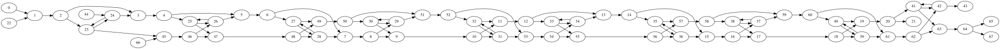

In [8]:
from graphviz import Digraph

# Function to create a DOT representation of linked lists
def visualise(start_ids, partition_dict, dot=None):
    visited = []
    def visualise_recursive(start_ids, partition_dict, dot):
        nonlocal visited
        if dot is None:
            dot = Digraph(comment='Partition Graph')

        for i, sp in enumerate(start_ids):
            current_partition = partition_dict[sp]
            if current_partition.partition_id in visited:
                return dot
            dot.node(f"{current_partition.partition_id}", str(current_partition.partition_id))
            visited.append(current_partition.partition_id)
            children_ids = current_partition.get_children()
            for child_id in children_ids:
                child_partition = partition_dict[child_id]
                dot = visualise_recursive([child_id], partition_dict, dot)
                dot.edge(f"{current_partition.partition_id}", f"{child_partition.partition_id}")
        return dot
    return visualise_recursive(start_ids, partition_dict, dot)

 # Sample linked lists

# Create a DOT representation
dot_representation = visualise(start_partition_ids, partition_dict)
dot_representation.attr(rankdir='LR')  
# Display the DOT representation in a Jupyter Notebook (optional)
dot_representation

In [9]:
components = Partition.tarjan_strongly_connected(partition_dict)
print (components)

[[43], [65], [67], [64], [63], [42, 41], [21], [20], [19], [62], [61], [39, 40], [60], [59], [18], [17], [37, 38], [58], [57], [16], [15], [36, 35], [14], [13], [56], [55], [34, 33], [12], [11], [54], [53], [31, 32], [52], [51], [10], [9], [29, 30], [50], [49], [8], [7], [28, 27], [6], [5], [48], [47], [26, 25], [4], [3], [46], [45], [24, 23], [2], [1], [0], [22], [44], [66]]


In [10]:
partition_dict = Partition.merge_strongly_connected_components(partition_dict, components)
for sid in start_partition_ids:
    if sid not in partition_dict:
        print ("Something is wrong")

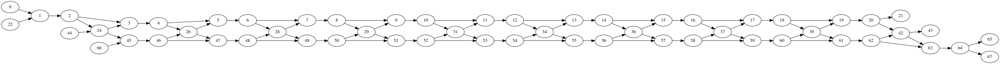

In [11]:
from graphviz import Digraph

 # Sample linked lists
# Create a DOT representation
dot_representation = visualise(start_partition_ids, partition_dict)
dot_representation.attr(rankdir='LR')  
# Display the DOT representation in a Jupyter Notebook (optional)
dot_representation

In [12]:
root_partitions = []
for root_id in start_partition_ids:
    root_partitions.append(partition_dict[root_id])
    print(root_id)
    print(partition_dict[root_id].partition_id)

0
0
22
22
44
44
66
66


In [13]:
unique_processes = trace.events['Process'].unique()
print (type(root_partitions[0]))

<class 'pipit.partitions.partition.Partition'>


In [14]:
from pipit.partitions.leap import Partition_DAG, Leap


dag = Partition_DAG(root_partitions, partition_dict, set(unique_processes))

In [15]:
dag.create_dag()
dag.calculate_distance()
# x = dag.leaps

node 0
node 1
node 2
node 24
node 3
node 4
node 26
node 5
node 6
node 28
node 49
node 50
node 51
node 52
node 53
node 54
node 34
node 13
node 14
node 36
node 57
node 58
node 59
node 60
node 61
node 62
node 42
node 43
node 63
node 64
node 65
node 67
node 63
node 39
node 19
node 20
node 42
node 21
node 61
node 37
node 17
node 18
node 19
node 39
node 59
node 15
node 16
node 17
node 37
node 15
node 55
node 56
node 57
node 36
node 55
node 31
node 11
node 12
node 34
node 13
node 53
node 29
node 9
node 10
node 11
node 31
node 51
node 7
node 8
node 9
node 29
node 7
node 47
node 48
node 49
node 28
node 5
node 45
node 46
node 26
node 47
node 3
node 66
node 45
node 44
node 24
node 22
node 1
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
27
28
29
29
27
28
29
29
24
25
26
27
28
28
29
30
30
27
25
26
27
28
28
29
30
30
28
29
30
30
22
23
24
25
26
27
28
28
29
30
30
27
25
26
27
28
29
29
30
31
31
28
26
27
28
29
29
30
31
31
29
30
31
31
23
24
26
27
28
29
29
30
31
31
29
30
31
31
25
26

32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
3

33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
3

33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
16
17
18
19
20
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
2

31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
2

25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
3

28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
3

29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
2

28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
16
17
18
19
20
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
2

30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
10
11
13
14
16
17
18
19
20
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
3

31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
3

33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
3

31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
3

30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
3

33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
3

33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
2

31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
3

33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
3

32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
3

30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
3

33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
3

32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
3

25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
12
13
14
16
17
18
19
20
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
3

30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
2

28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
2

32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
2

23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
7
8
10
11
13
14
16
17
18
19
20
21
22


32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
16
17
18
19
20
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
2

32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
3

29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
2

33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
16
17
18
19
20
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
3

32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
12
13
14
16
17
18
19
20
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
3

33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
3

33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
3

23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
3

28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
3

31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
15
16
17
18
19
20
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
3

30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
3

31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
3

29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
2

33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
3

31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
2

33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
3

30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
3

33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
2

30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
2

33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
3

31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
3

31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
16
17
18
19
20
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
3

33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
2

30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
3

28
29
30
31
31
32
33
33
31
32
33
33
19
20
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
1

31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
15
16
17
18
19
20
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
3

30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
3

33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
3

33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
3

33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
2

33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
3

31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
16
17
18
19
20
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
3

31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
2

33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
15
16
17
18
19
20
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
3

30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
2

33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
16
17
18
19
20
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
3

33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
3

25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
3

25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
3

32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
3

31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
2

33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
3

33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
16
17
18
19
20
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
3

31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
3

28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
2

30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
3

32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
2

30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
3

29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
2

27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
3

31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
3

30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
7
8
10
11
13
14
16
17
18
19
20
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33


32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
3

30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
3

25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
10
11
13
14
16
17
18
19
20
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
3

31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
3

32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
2

33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
2

29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
10
11
13
14
16
17
18
19
20
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
3

31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
3

29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
2

29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
2

30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
3

29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
3

28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
3

33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
3

33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
2

30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
15
16
17
18
19
20
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
2

31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
2

28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
13
14
16
17
18
19
20
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
3

26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
16
17
18
19
20
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
3

32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
3

30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
3

31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
15
16
17
18
19
20
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
2

32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
3

33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
16
17
18
19
20
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
3

33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
3

29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
15
16
17
18
19
20
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
3

31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
3

27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
3

30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
3

33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
3

29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
2

29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
13
14
16
17
18
19
20
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
3

33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
2

31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
2

31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
3

31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
3

31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
3

31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
3

31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
15
16
17
18
19
20
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
3

30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
3

30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
3

31
31
32
33
33
31
32
33
33
19
20
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
15
16
17
1

30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
3

28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
16
17
18
19
20
21
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
2

28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
22
23
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
19
20
22
23
25
26
28
29
30
31
31
32
33
33
31
32
33
33
27
28
29
30
31
31
32
33
33
30
28
29
30
31
31
32
33
33
31
32
33
33
24
25
26
28
29
30
31
31
32
33
33
30
27
28
29
30
31
31
32
33
33
30
28
29
30
31
3

In [16]:
display(dag.df)

display(dag.roots)

,Partition ID,Distance
0,0,0
1,1,1
2,2,2
3,24,3
4,3,4
5,4,5
6,26,6
7,5,7
8,6,8
9,28,9


{<pipit.partitions.partition.Partition at 0x179e5fc50>,
 <pipit.partitions.partition.Partition at 0x179e744d0>}

In [17]:
print(len(dag.df))
print(len(dag.df['Partition ID'].unique()))

58
58


In [18]:
dag.create_leaps()
i = 0
for leap in dag.leaps:
    print('leap', i)
    for p in leap.partitions_ids:
        print(' ', p)
    i += 1

leap 0
  0
  66
  44
  22
leap 1
  1
leap 2
  2
leap 3
  24
leap 4
  3
  45
leap 5
  4
  46
leap 6
  26
leap 7
  5
  47
leap 8
  48
  6
leap 9
  28
leap 10
  49
  7
leap 11
  8
  50
leap 12
  29
leap 13
  9
  51
leap 14
  10
  52
leap 15
  31
leap 16
  11
  53
leap 17
  12
  54
leap 18
  34
leap 19
  13
  55
leap 20
  56
  14
leap 21
  36
leap 22
  57
  15
leap 23
  16
  58
leap 24
  37
leap 25
  17
  59
leap 26
  18
  60
leap 27
  39
leap 28
  19
  61
leap 29
  20
  62
leap 30
  42
  21
leap 31
  43
  63
leap 32
  64
leap 33
  65
  67


{2: <pipit.partitions.event.Event object at 0x179e5ef10>, 6: <pipit.partitions.event.Event object at 0x13a995dd0>, 0: <pipit.partitions.event.Event object at 0x13a93e610>, 8: <pipit.partitions.event.Event object at 0x179c0c1d0>}


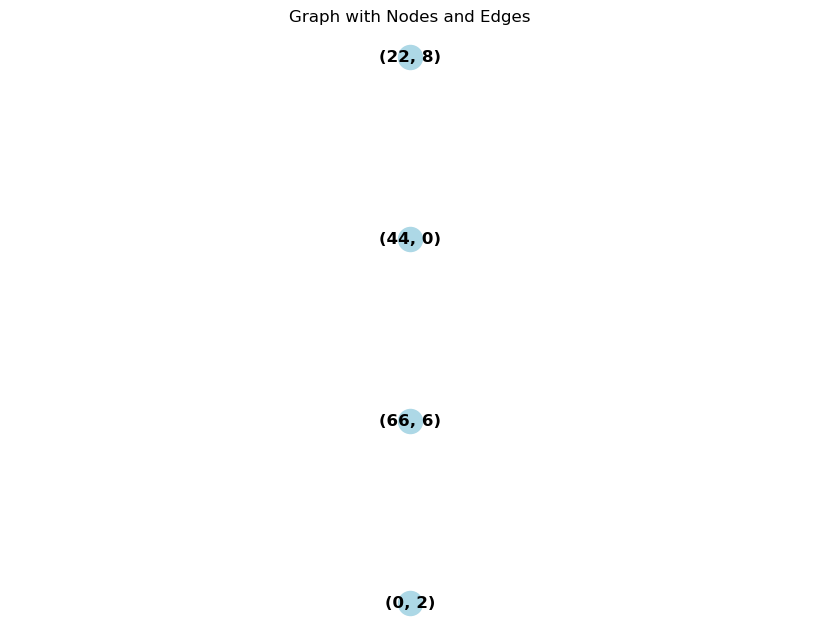

-------------


In [19]:
import networkx as nx
import matplotlib.pyplot as plt

def get_send_dag(leap, partition_map):
    # returns a dictionary of send events and their children

    # Get all events in the leap
    event_dict = {}
    for partition_id in leap.partitions_ids:
        partition = partition_map[partition_id]
        event_dict.update(partition.get_events())
    print(event_dict)

    # Create a DAG using only the MpiSend events
    send_dag_nodes = []
    send_dag_edges = pd.DataFrame(columns=['Node1', 'Node2'])

    for event_id, event in event_dict.items():
        if event.event_name != "MpiRecv":
            node1 = (event.get_partition().partition_id, event.event_id)
            send_dag_nodes.append(node1)

            # Traverse the next event until you find a non-recv event
            next_event = event.get_next_event()
            while next_event is not None and next_event.event_id in event_dict.keys():
                if next_event.event_name != "MpiRecv":
                    node2 = (next_event.get_partition().partition_id, next_event.event_id)
                    send_dag_edges.loc[len(send_dag_edges.index)] = [node1, node2]
                    break
                else:
                    next_event = next_event.get_next_event()

            # Traverse the next starting from the matching event until you find a non-recv event
            next_event = event.get_matching_event()
            while next_event is not None and next_event.event_id in event_dict.keys():
                if next_event.event_name != "MpiRecv":
                    node2 = (next_event.get_partition().partition_id, next_event.event_id)
                    send_dag_edges.loc[len(send_dag_edges.index)] = [node1, node2]
                    break
                else:
                    next_event = next_event.get_next_event()
    return send_dag_nodes, send_dag_edges

for leap in dag.leaps:
    print (leap)
    send_dag = get_send_dag(leap, dag.partition_map)
    # Create an empty directed graph
    G = nx.DiGraph()

    # Add nodes to the graph
    G.add_nodes_from(send_dag[0])

    # Add edges to the graph from the DataFrame
    G.add_edges_from(send_dag[1].to_records(index=False))

    # Plot the graph
    pos = nx.nx_agraph.graphviz_layout(G, prog='dot', args='-Grankdir=LR')

    plt.figure(figsize=(8, 6))
    nx.draw(G, pos, with_labels=True, font_weight='bold', node_color='lightblue', arrowsize=20)
    plt.title('Graph with Nodes and Edges')
    plt.show()

    print ("-------------")
    break